In this peroject, you will create a deep learning model that detects the TNt tubes formed in between cells. Below is a berief decsripton of what TNTs are:

"Tunneling nanotubes (TNTs) are elongated structures extending from and connecting cancer cell membranes. They permit the exchange of molecules, vesicles, and mitochondria, as well as genetic and metabolic signals that promote carcinogenesis. Given that they permit intercellular trafficking and communication, TNTs may serve as an important imaging biomarker of cancer cell response vs. resistance to therapy. On fluorescence imaging of cancer cell cultures, TNTs appear to be no thicker than 1 µm and vary in length from 10 to 100+ µm. TNTs can be spotted by a trained eye, but using human experts to obtain an accurate count and location of TNTs is a time-intensive process. A precise quantitative analysis of TNTs could aid in the objective assessment of cancer response to various therapeutic interventions."

In this project, the original images were created by taking a grid of 5 × 5 tiled images, each measuring 1388 × 1040 pixels, and then stitching them together. This process resulted in shadows along the stitched edges, which significantly degraded the model performance at later stages. You may start from removing these shadows. To remove those shadows, you may use BaSiC, an image correction method for background and shading correction for image sequences, available as a Fiji/ImageJ. You may consider other packages/lobraries for this purpose. You may also consider using different filters. You may check the following link: https://www.youtube.com/watch?v=xCHbcVUCYBI. You may find very useful short videos in that channel for image processing.

After preprocessing, you may want to divide the original image into smaller pieces. The original image in the training dataset was stitched together resulting in an image - size of 6283 × 4687 pixels. You can scan the images  with a sliding window of 512 × 512 pixels with a stride of 10 pixels, extracting patches containing the TNT regions using a bounding box. You may write a function that takes the window size as input. You may later create smaller images from 512x512 images using the same function.

Once you form training and test datasets from smaller images, you may simply train a VGG model. You may try different models. you goal is to find the images that contain TNTs. You may create multiple models that are trained with images with different sizes. 

# Image Preprocessing

This is the image with labels

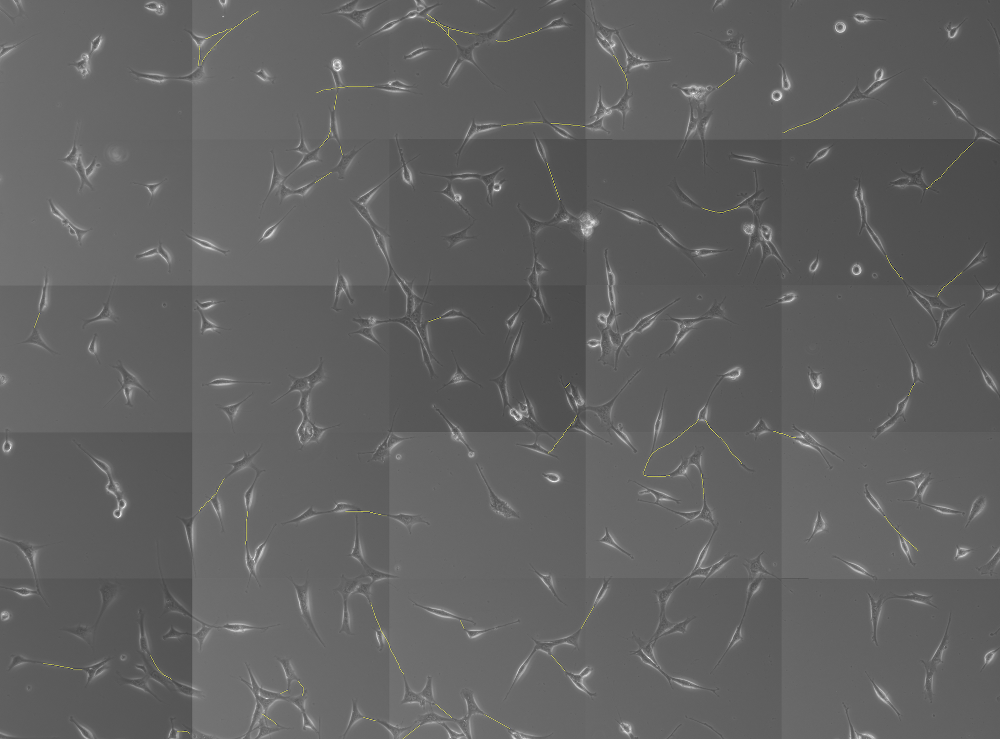

This is the same image without labels.

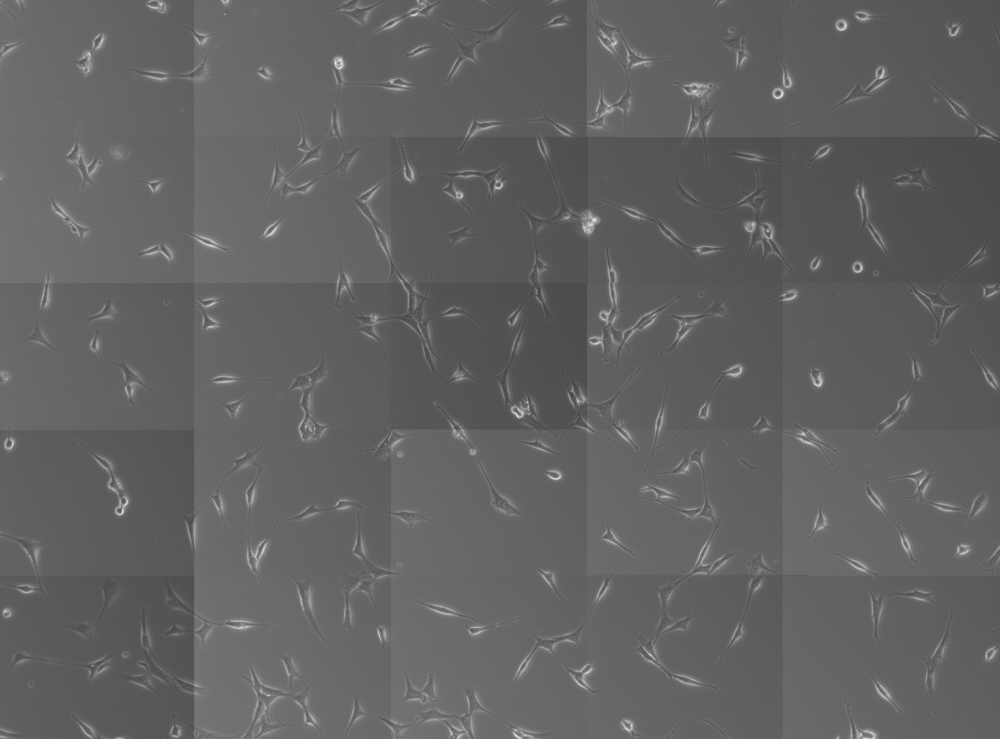

In [1]:
import os
# Remove any existing LD_LIBRARY_PATH to avoid conflicts
os.environ["LD_LIBRARY_PATH"] = "/usr/lib/x86_64-linux-gnu:/usr/local/cuda-12.5/lib64"
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
os.environ["TF_FORCE_GPU_ALLOW_GROWTH"] = "true"
os.environ["CUDA_HOME"] = "/usr/local/cuda-12.5"

import tensorflow as tf
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    try:
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
    except RuntimeError as e:
        print(e)
        
import numpy as np
import pandas as pd 
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img
from tensorflow.keras.utils import to_categorical
import tensorflow_addons as tfa
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import random
import glob
from PIL import Image
        
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))
print("TensorFlow version:", tf.__version__)
print("Built with CUDA:", tf.test.is_built_with_cuda())
print("GPU Device Name:", tf.test.gpu_device_name())
print("List of GPUs:", tf.config.list_physical_devices('GPU'))

2025-03-01 17:17:22.522691: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-03-01 17:17:22.532275: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1740878242.543487   38031 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1740878242.546866   38031 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-03-01 17:17:22.558315: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instr

Num GPUs Available:  1
TensorFlow version: 2.18.0
Built with CUDA: True
GPU Device Name: /device:GPU:0
List of GPUs: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


/home/oem/Documents/github/magnimind_projects/magpenv/lib/python3.12/site-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(
/home/oem/Documents/github/magnimind_projects/magpenv/lib/python3.12/site-packages/tensorflow_addons/utils/ensure_tf_install.py:53: UserWarning: Tensorflow Addons supports using Python ops for all Tensorflow versions above or equal to 2.13.0 and strictly below 2.16.0 (nightly versions are not supported). 
 The versions of TensorFlow you are currently using is 2.18.0 and is not supported. 
Some things might work, some things might not.
I

- Create folders to save the images that are created by splitting the main image into smaller pieces


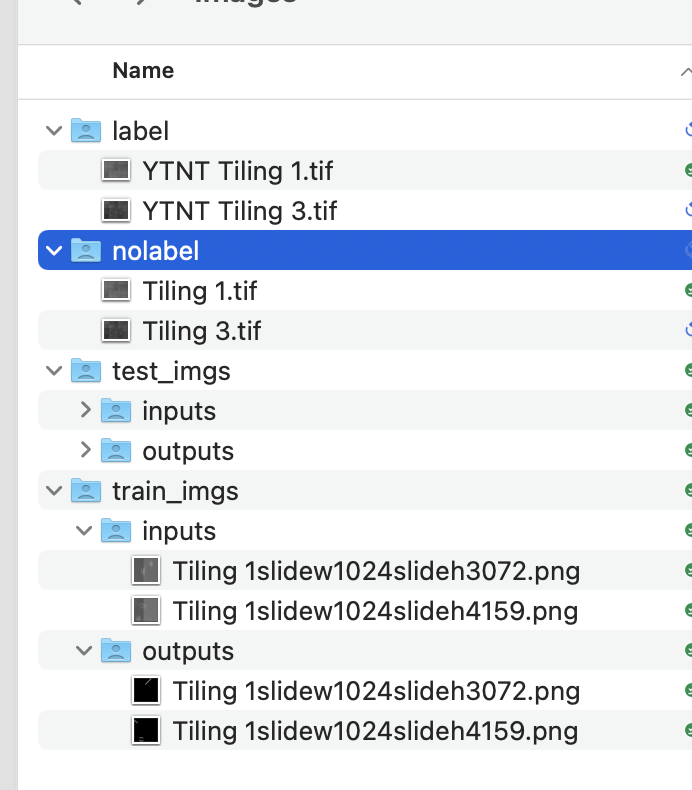

- Create smaller pieces from the main image by moving a window along the image. Mark the pieces with TNTs as 1 and all others as 0. This will give you the labeled images for your classification model.

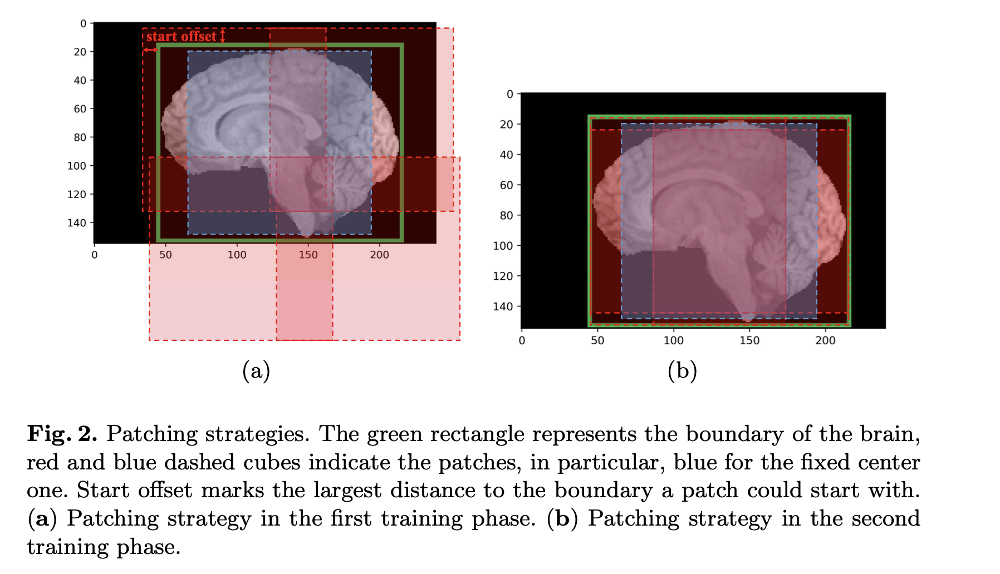

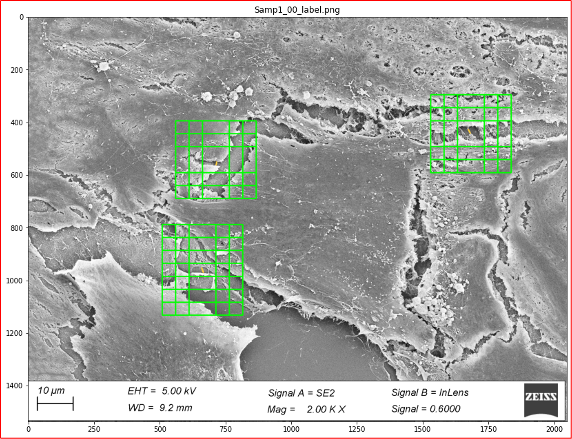

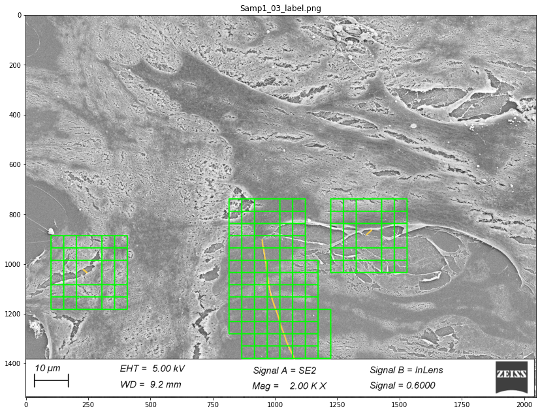

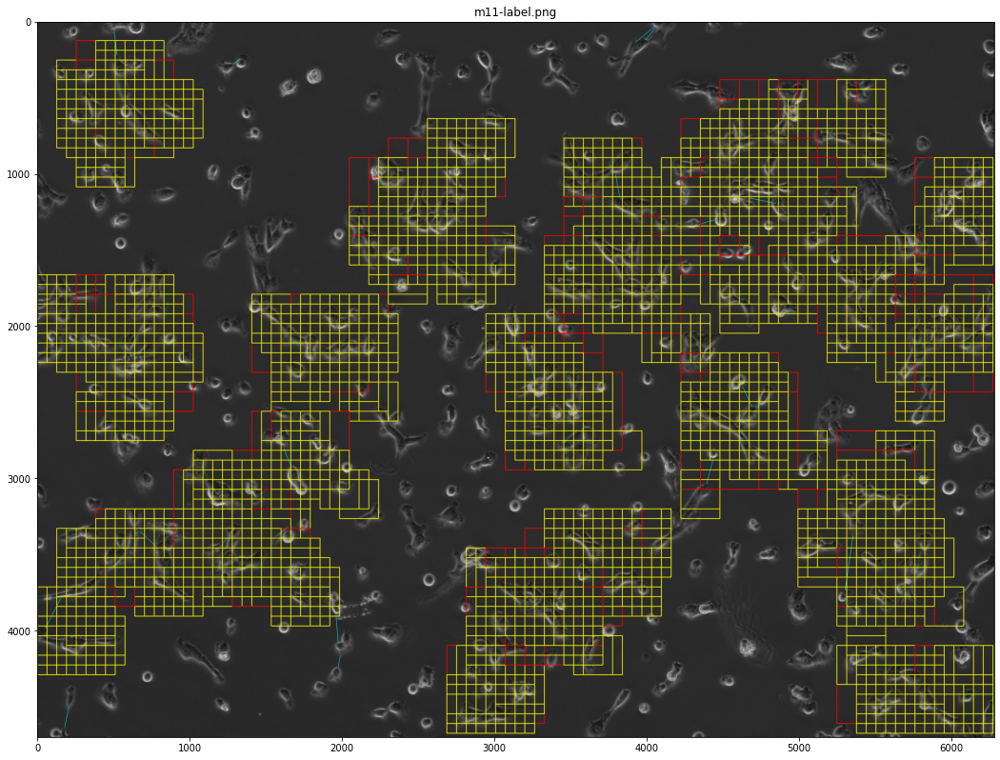

In [2]:
import os
import cv2
import numpy as np
import glob

# Create output directories if they don't exist
os.makedirs('./data/tnt/nolabel', exist_ok=True)
os.makedirs('./data/tnt/label', exist_ok=True)

# Load the original images
image_nolabel = cv2.imread('./data/tnt/m05.png')
image_label = cv2.imread('./data/tnt/m05-label.png')

if image_nolabel is None or image_label is None:
    raise IOError("One or both input images could not be loaded.")

# Get image dimensions (expected around 4690x6278 pixels)
height, width, _ = image_nolabel.shape
print(f'height: {height}')
print(f'width: {width}')

height: 4690
width: 6278


In [35]:
# Define your filtering functions
def remove_shadows_color(image, kernel_size=(3,3)):
    """
    Remove shadows from an RGB image by processing the V channel in HSV.
    This function preserves hue and saturation.
    """
    hsv = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
    h, s, v = cv2.split(hsv)
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, kernel_size)
    background = cv2.morphologyEx(v, cv2.MORPH_OPEN, kernel)
    diff = cv2.subtract(v, background)
    norm = cv2.normalize(diff, None, alpha=0, beta=255,
                           norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_8U)
    hsv_corrected = cv2.merge([h, s, norm])
    corrected_rgb = cv2.cvtColor(hsv_corrected, cv2.COLOR_HSV2RGB)
    return corrected_rgb

# Directories for saving tiles
nolabel_dir = './data/tnt/nolabel'
label_dir = './data/tnt/label'
os.makedirs(nolabel_dir, exist_ok=True)
os.makedirs(label_dir, exist_ok=True)

# Load the full stitched images
image_nolabel = cv2.imread('./data/tnt/m05.png')  # Original no-label image
image_label   = cv2.imread('./data/tnt/m05-label.png')  # Label image with yellow lines

if image_nolabel is None or image_label is None:
    print("Error loading stitched images.")
    exit(1)

# Get the dimensions of the full images
height, width = image_nolabel.shape[:2]

# Define grid size for splitting (adjust rows and cols as needed)
rows, cols = 30, 40
tile_width = width // cols
tile_height = height // rows

tile_num = 1
for i in range(rows):
    for j in range(cols):
        # Calculate the top-left corner for the tile
        x = j * tile_width
        y = i * tile_height

        # Crop the tile from the no-label image
        tile_nolabel = image_nolabel[y:y + tile_height, x:x + tile_width]
        # Crop the tile from the label image
        tile_label = image_label[y:y + tile_height, x:x + tile_width]

        # ----------------------- Apply Filtering -----------------------
        # For the no-label tile:
        # Convert from BGR to RGB for filtering
        tile_nolabel_rgb = cv2.cvtColor(tile_nolabel, cv2.COLOR_BGR2RGB)
        # Remove shadows from the tile
        tile_nolabel_filtered_rgb = remove_shadows_color(tile_nolabel_rgb, kernel_size=(3, 3))
        # Convert back to BGR for saving
        tile_nolabel_filtered = cv2.cvtColor(tile_nolabel_filtered_rgb, cv2.COLOR_RGB2BGR)

        # For the label tile:
        # Convert from BGR to RGB
        tile_label_rgb = cv2.cvtColor(tile_label, cv2.COLOR_BGR2RGB)
        # Remove shadows only (do not accentuate yellow here)
        tile_label_filtered_rgb = remove_shadows_color(tile_label_rgb, kernel_size=(3, 3))
        # Convert back to BGR for further processing
        tile_label_filtered = cv2.cvtColor(tile_label_filtered_rgb, cv2.COLOR_RGB2BGR)
        # Now convert the filtered label tile to HSV and extract the yellow mask.
        hsv_tile = cv2.cvtColor(tile_label_filtered, cv2.COLOR_BGR2HSV)
        # Define the HSV range for yellow (adjust these values as needed)
        lower_yellow = np.array([20, 100, 100])
        upper_yellow = np.array([30, 255, 255])
        mask = cv2.inRange(hsv_tile, lower_yellow, upper_yellow)
        binary_mask = mask
        # -----------------------------------------------------------------

        # Define file names for the tiles
        nolabel_filename = os.path.join(nolabel_dir, f'tnt_tile{tile_num}.tif')
        label_filename   = os.path.join(label_dir, f'ytnt_tile{tile_num}.tif')

        # Save the processed tiles
        cv2.imwrite(nolabel_filename, tile_nolabel_filtered)
        cv2.imwrite(label_filename, binary_mask)

        tile_num += 1

print(f"Saved {tile_num - 1} tiles in both the 'nolabel' and 'label' directories.")

Saved 1200 tiles in both the 'nolabel' and 'label' directories.


Total samples available: 1200


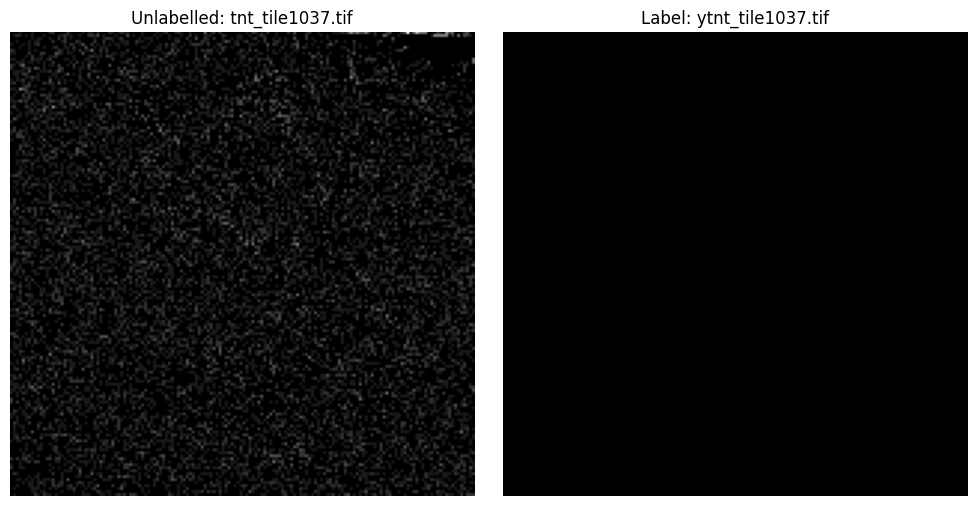

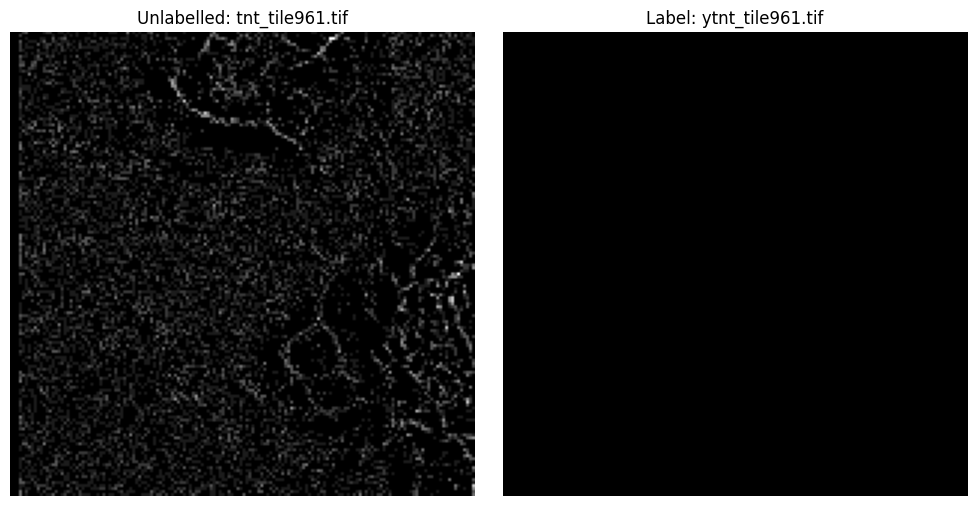

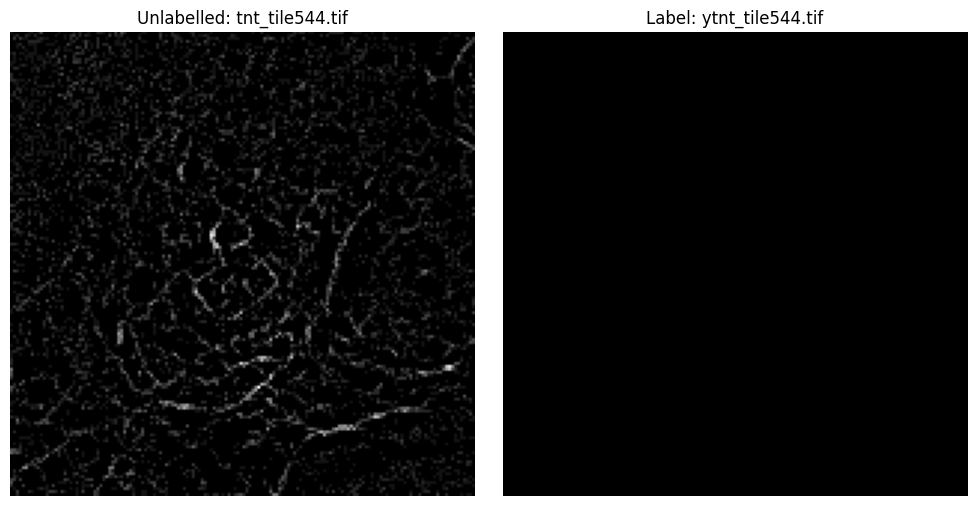

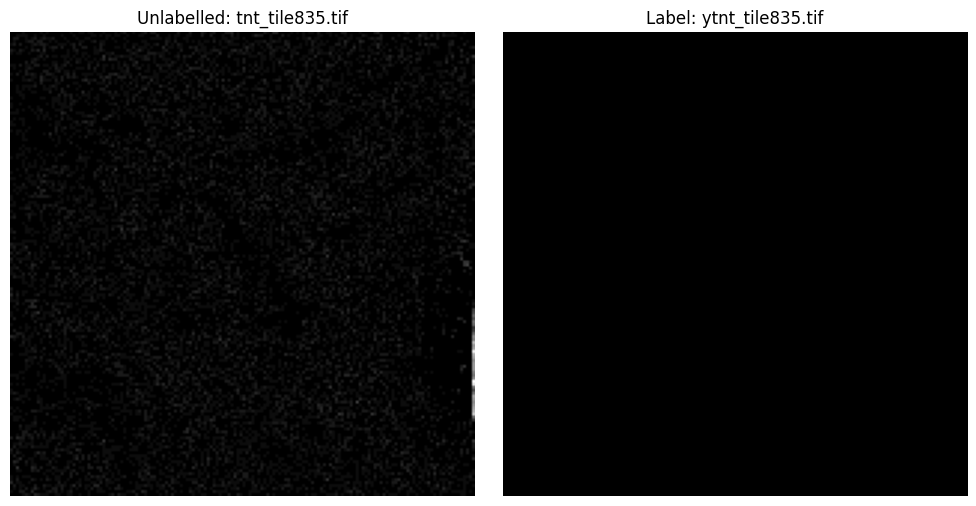

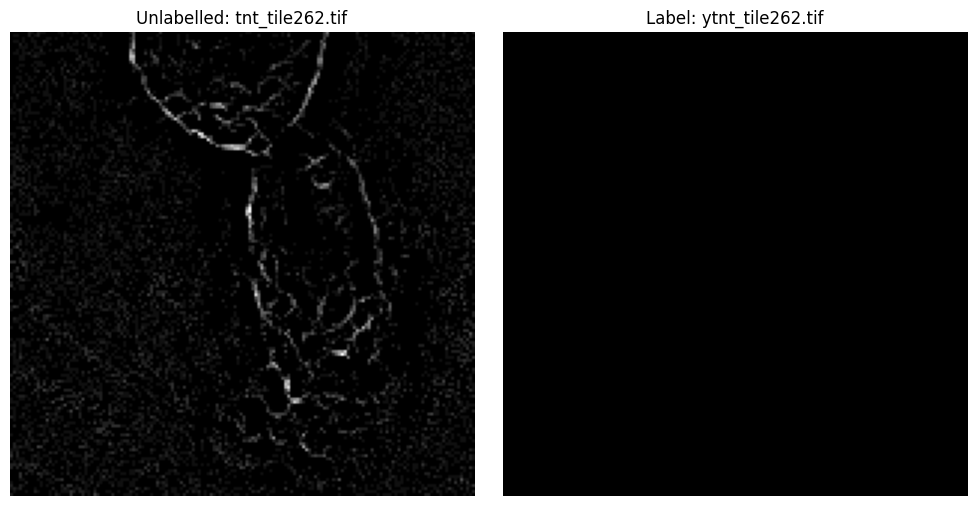

...

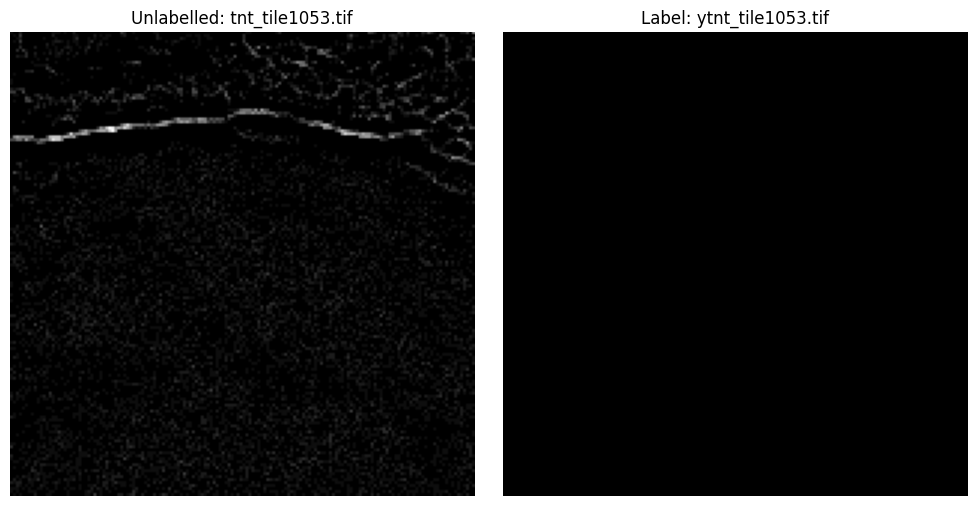

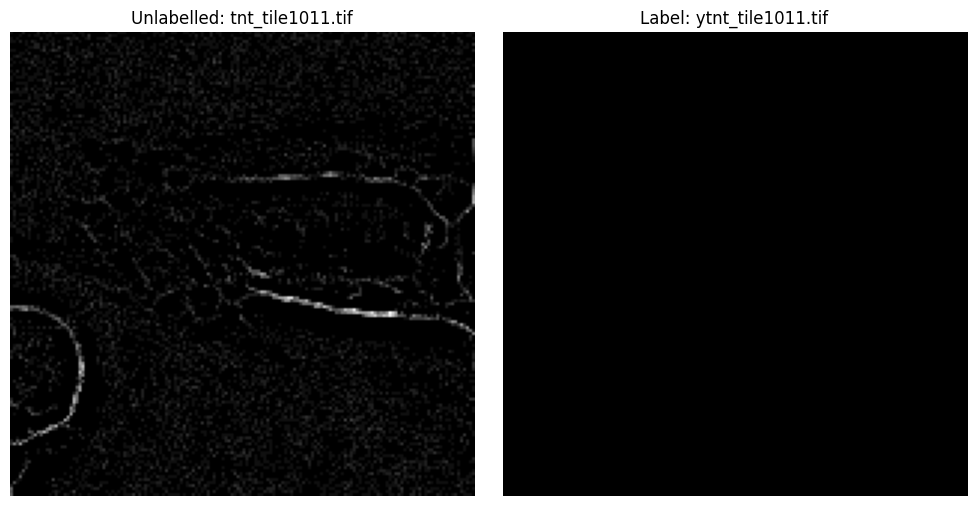

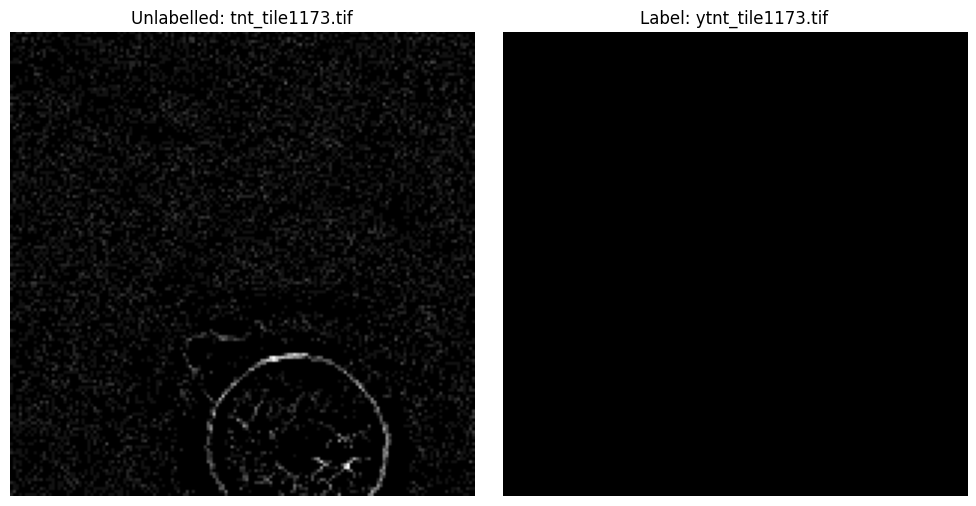

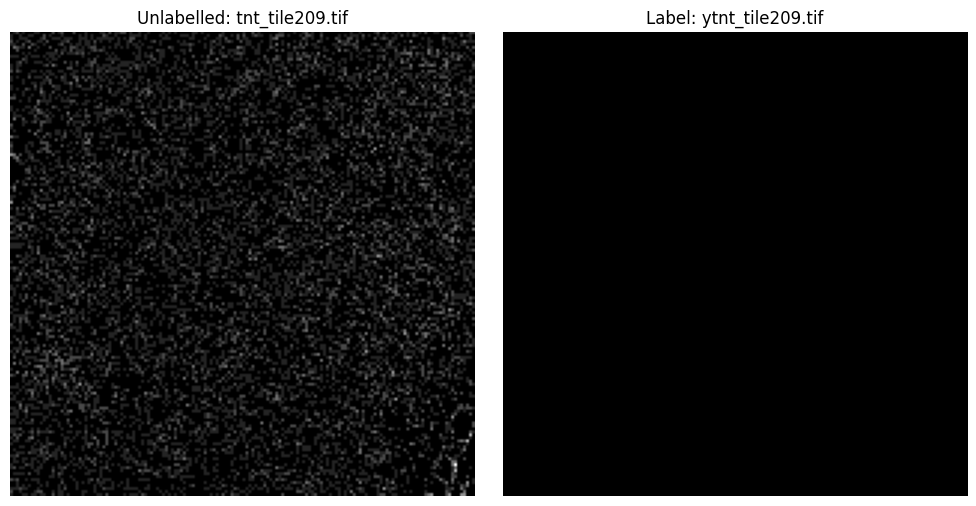

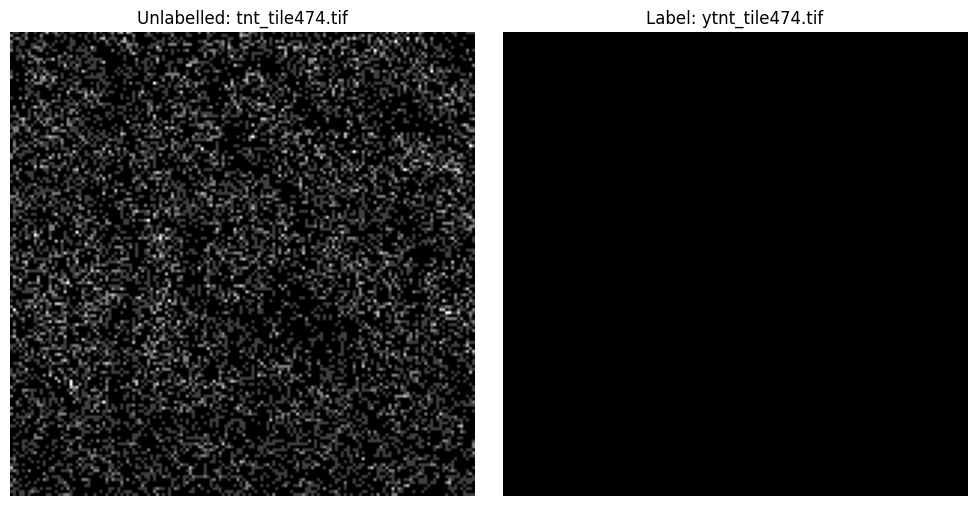

In [36]:
# Plot 25 pairs of corresponding label and non-labelled pictures side by side

import os
import cv2
import matplotlib.pyplot as plt
import random

# Directories containing the images
nolabel_dir = './data/tnt/nolabel'
label_dir = './data/tnt/label'

# Get the lists of filenames
nolabel_files = sorted(os.listdir(nolabel_dir))
label_files = sorted(os.listdir(label_dir))

# Ensure both lists have the same length (or adjust accordingly)
num_samples = len(nolabel_files)
print("Total samples available:", num_samples)

# Randomly choose 25 indices (or fewer if not enough samples)
sample_count = 25
indices = random.sample(range(num_samples), min(sample_count, num_samples))

# Loop over the selected indices and display the corresponding pairs
for idx in indices:
    nl_file = nolabel_files[idx]
    lab_file = label_files[idx]
    nl_path = os.path.join(nolabel_dir, nl_file)
    lab_path = os.path.join(label_dir, lab_file)
    
    # Load the unlabelled image (color image)
    nl_image = cv2.imread(nl_path)
    if nl_image is None:
        print(f"Could not load image: {nl_path}")
        continue
    # Convert from BGR (OpenCV default) to RGB for displaying with matplotlib
    nl_image_rgb = cv2.cvtColor(nl_image, cv2.COLOR_BGR2RGB)
    
    # Load the labelled image (binary mask); load as grayscale for simplicity
    lab_image = cv2.imread(lab_path, cv2.IMREAD_GRAYSCALE)
    if lab_image is None:
        print(f"Could not load image: {lab_path}")
        continue

    # Create a figure with two subplots side by side
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(nl_image_rgb)
    plt.title(f'Unlabelled: {nl_file}')
    plt.axis('off')
    
    plt.subplot(1, 2, 2)
    plt.imshow(lab_image, cmap='gray')
    plt.title(f'Label: {lab_file}')
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()



# classification model training



- Use cv2.threshold and cv2.dilate to create image masks

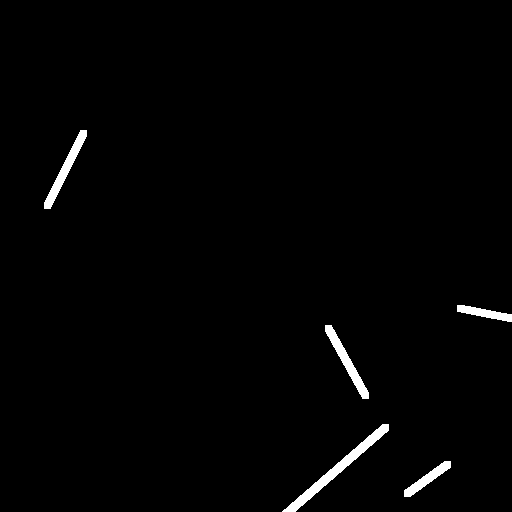

- Use transfer learning to create a classification model for images with and without TNTs
- You can start from and use VGG16
- Your goal is to run as many as models as the types of images you created in the preprocessing step, that is, if you created images of size 512 and 250 pixels, then you will have two models for each image size.

In [37]:
import os, glob
import numpy as np
import tensorflow as tf
import tensorflow_addons as tfa
from PIL import Image
import matplotlib.pyplot as plt

# Set data directories (update these paths if needed)
input_dir = './data/tnt/nolabel'
label_dir = './data/tnt/label'

print("Input images:", os.listdir(input_dir))
print("Label images:", os.listdir(label_dir))

# =============================================================================
# 1. Create a tf.data.Dataset for segmentation with validation split
# =============================================================================
input_files = sorted(glob.glob(os.path.join(input_dir, "*.tif")))
label_files = sorted(glob.glob(os.path.join(label_dir, "*.tif")))

print("Number of input images:", len(input_files))
print("Number of label images:", len(label_files))

# Split files into training and validation sets (e.g., 80% train, 20% validation)
split_idx = int(len(input_files) * 0.8)
train_input_files = input_files[:split_idx]
val_input_files = input_files[split_idx:]
train_label_files = label_files[:split_idx]
val_label_files = label_files[split_idx:]

IMG_SIZE = (512, 512)

def load_image_and_mask(input_path, label_path):
    def _load_image_and_mask(input_path_tensor, label_path_tensor):
        input_path_str = input_path_tensor.numpy().decode('utf-8')
        label_path_str = label_path_tensor.numpy().decode('utf-8')
        
        # Load input image using PIL
        input_img = Image.open(input_path_str).convert('RGB')
        input_img = input_img.resize(IMG_SIZE, Image.BILINEAR)
        input_img = np.array(input_img).astype(np.float32) / 255.0
        
        # Load label image (grayscale)
        label_img = Image.open(label_path_str).convert('L')
        label_img = label_img.resize(IMG_SIZE, Image.NEAREST)
        label_img = np.array(label_img).astype(np.float32) / 255.0
        # Threshold to obtain binary mask (0 or 1)
        label_img = (label_img > 0.5).astype(np.float32)
        label_img = np.expand_dims(label_img, axis=-1)
        
        return input_img, label_img

    input_img, label_img = tf.py_function(
        _load_image_and_mask, [input_path, label_path], [tf.float32, tf.float32]
    )
    input_img.set_shape([IMG_SIZE[0], IMG_SIZE[1], 3])
    label_img.set_shape([IMG_SIZE[0], IMG_SIZE[1], 1])
    return input_img, label_img

# Data augmentation function (applied only to the training set)
def augment_image_and_mask(image, mask):
    # Random horizontal flip
    if tf.random.uniform([]) > 0.5:
        image = tf.image.flip_left_right(image)
        mask = tf.image.flip_left_right(mask)
    # Random vertical flip
    if tf.random.uniform([]) > 0.5:
        image = tf.image.flip_up_down(image)
        mask = tf.image.flip_up_down(mask)
    
    # Random rotation: rotate by a random angle between -15 and 15 degrees
    angle = tf.random.uniform([], minval=-15, maxval=15, dtype=tf.float32)
    radian = angle * np.pi / 180
    image = tfa.image.rotate(image, radian, interpolation='BILINEAR')
    mask = tfa.image.rotate(mask, radian, interpolation='NEAREST')
    
    # Random zoom: randomly crop a portion and then resize back to IMG_SIZE
    zoom_factor = tf.random.uniform([], minval=0.8, maxval=1.0, dtype=tf.float32)
    new_height = tf.cast(zoom_factor * IMG_SIZE[0], tf.int32)
    new_width = tf.cast(zoom_factor * IMG_SIZE[1], tf.int32)
    combined = tf.concat([image, mask], axis=-1)  # ensure same crop is applied
    combined = tf.image.random_crop(combined, size=[new_height, new_width, 4])
    combined = tf.image.resize(combined, IMG_SIZE, method=tf.image.ResizeMethod.BILINEAR)
    # Separate image and mask (assume mask is the last channel, then round it)
    image = combined[..., :3]
    mask = combined[..., 3:]
    mask = tf.where(mask > 0.5, 1.0, 0.0)
    
    # Random brightness and contrast (applied only to image)
    image = tf.image.random_brightness(image, max_delta=0.1)
    image = tf.image.random_contrast(image, lower=0.9, upper=1.1)
    
    return image, mask

# Optionally, positive sampling function remains unchanged
def positive_sampling(image, mask, pos_threshold=0.01):
    pos_ratio = tf.reduce_mean(mask)
    def crop_more():
        cropped_img = tf.image.central_crop(image, central_fraction=0.8)
        cropped_mask = tf.image.central_crop(mask, central_fraction=0.8)
        cropped_img = tf.image.resize(cropped_img, IMG_SIZE, method=tf.image.ResizeMethod.BILINEAR)
        cropped_mask = tf.image.resize(cropped_mask, IMG_SIZE, method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
        return cropped_img, cropped_mask
    return tf.cond(pos_ratio < pos_threshold, crop_more, lambda: (image, mask))

# Create the training dataset (with augmentation and positive sampling)
BATCH_SIZE = 2
train_dataset = tf.data.Dataset.from_tensor_slices((train_input_files, train_label_files))
train_dataset = train_dataset.map(lambda x, y: load_image_and_mask(x, y),
                                  num_parallel_calls=tf.data.AUTOTUNE)
train_dataset = train_dataset.map(augment_image_and_mask, num_parallel_calls=tf.data.AUTOTUNE)
train_dataset = train_dataset.map(positive_sampling, num_parallel_calls=tf.data.AUTOTUNE)
train_dataset = train_dataset.batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)

# Create the validation dataset (without augmentation)
val_dataset = tf.data.Dataset.from_tensor_slices((val_input_files, val_label_files))
val_dataset = val_dataset.map(lambda x, y: load_image_and_mask(x, y),
                              num_parallel_calls=tf.data.AUTOTUNE)
val_dataset = val_dataset.batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)

# =============================================================================
# 2. Build the VGG16-based Segmentation Model
# =============================================================================
from tensorflow.keras.applications import VGG16
from tensorflow.keras import layers, models

def build_vgg16_segmentation_model(input_shape=(512,512,3), num_classes=1):
    base_model = VGG16(weights='imagenet', include_top=False, input_shape=input_shape)
    x = base_model.output  # shape: (None, 16, 16, 512)
    x = layers.Conv2D(512, (3,3), activation='relu', padding='same')(x)
    x = layers.UpSampling2D((2,2))(x)  # 16 -> 32
    x = layers.Conv2D(256, (3,3), activation='relu', padding='same')(x)
    x = layers.UpSampling2D((2,2))(x)  # 32 -> 64
    x = layers.Conv2D(128, (3,3), activation='relu', padding='same')(x)
    x = layers.UpSampling2D((2,2))(x)  # 64 -> 128
    x = layers.Conv2D(64, (3,3), activation='relu', padding='same')(x)
    x = layers.UpSampling2D((2,2))(x)  # 128 -> 256
    x = layers.Conv2D(32, (3,3), activation='relu', padding='same')(x)
    x = layers.UpSampling2D((2,2))(x)  # 256 -> 512
    outputs = layers.Conv2D(num_classes, (1,1), activation='sigmoid')(x)
    model = models.Model(inputs=base_model.input, outputs=outputs)
    return model

model = build_vgg16_segmentation_model()
model.summary()

# =============================================================================
# 3. Define Loss Functions (Combined BCE and Dice Loss)
# =============================================================================
def weighted_bce(y_true, y_pred):
    pos_weight = 80.0  # adjust based on your data imbalance
    loss = tf.keras.losses.binary_crossentropy(y_true, y_pred)
    y_true_squeezed = tf.squeeze(y_true, axis=-1)  # shape: [batch, 512, 512]
    weight = y_true_squeezed * pos_weight + (1 - y_true_squeezed)
    return tf.reduce_mean(loss * weight)

def dice_loss(y_true, y_pred, smooth=1):
    y_true_f = tf.reshape(y_true, [-1])
    y_pred_f = tf.reshape(y_pred, [-1])
    intersection = tf.reduce_sum(y_true_f * y_pred_f)
    return 1 - (2. * intersection + smooth) / (tf.reduce_sum(y_true_f) + tf.reduce_sum(y_pred_f) + smooth)

def focal_loss(y_true, y_pred, gamma=2.0, alpha=0.25):
    epsilon = 1e-7
    y_pred = tf.clip_by_value(y_pred, epsilon, 1. - epsilon)
    cross_entropy = -y_true * tf.math.log(y_pred) - (1 - y_true) * tf.math.log(1 - y_pred)
    weight = alpha * tf.pow(1 - y_pred, gamma) * y_true + (1 - alpha) * tf.pow(y_pred, gamma) * (1 - y_true)
    return tf.reduce_mean(weight * cross_entropy)

def combined_loss(y_true, y_pred):
    fl = focal_loss(y_true, y_pred, gamma=2.0, alpha=0.25)
    wbce = weighted_bce(y_true, y_pred)
    dl = dice_loss(y_true, y_pred)
    return 0.3 * fl + 0.4 * wbce + 0.3 * dl  # Adjust the coefficients as needed

# =============================================================================
# 4. Compile and Train the Model with Early Stopping and Validation
# =============================================================================
optimizer = tf.keras.optimizers.Adam(learning_rate=1e-5)
model.compile(optimizer=optimizer, loss=combined_loss, metrics=['accuracy'])

early_stop = tf.keras.callbacks.EarlyStopping(monitor='loss', patience=5, min_delta=0.001, 
                                              restore_best_weights=True)

history = model.fit(
    train_dataset,
    epochs=100,
    validation_data=val_dataset,
    callbacks=[early_stop]
)

# Save the trained model
model.save('./models/tf_vgg16_segmentation_tubes.keras')
print("Training complete. Model saved as 'tf_vgg16_segmentation_tubes.keras'.")


Input images: ['tnt_tile1180.tif', 'tnt_tile1001.tif', 'tnt_tile1106.tif', 'tnt_tile586.tif', 'tnt_tile95.tif', 'tnt_tile402.tif', 'tnt_tile928.tif', 'tnt_tile537.tif', 'tnt_tile639.tif', 'tnt_tile295.tif', 'tnt_tile371.tif', 'tnt_tile393.tif', 'tnt_tile683.tif', 'tnt_tile130.tif', 'tnt_tile711.tif', 'tnt_tile854.tif', 'tnt_tile170.tif', 'tnt_tile422.tif', 'tnt_tile730.tif', 'tnt_tile785.tif', 'tnt_tile326.tif', 'tnt_tile54.tif', 'tnt_tile495.tif', 'tnt_tile589.tif', 'tnt_tile564.tif', 'tnt_tile665.tif', 'tnt_tile84.tif', 'tnt_tile1026.tif', 'tnt_tile428.tif', 'tnt_tile725.tif', 'tnt_tile981.tif', 'tnt_tile570.tif', 'tnt_tile97.tif', 'tnt_tile119.tif', 'tnt_tile648.tif', 'tnt_tile786.tif', 'tnt_tile659.tif', 'tnt_tile910.tif', 'tnt_tile1150.tif', 'tnt_tile649.tif', 'tnt_tile583.tif', 'tnt_tile341.tif', 'tnt_tile15.tif', 'tnt_tile128.tif', 'tnt_tile633.tif', 'tnt_tile320.tif', 'tnt_tile802.tif', 'tnt_tile1110.tif', 'tnt_tile3.tif', 'tnt_tile1022.tif', 'tnt_tile950.tif', 'tnt_tile1121.ti

Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)      │ (None, 512, 512, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 512, 512, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 512, 512, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 256, 256, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 256, 256, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 256, 256, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 128, 128, 128)  │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 128, 128, 256)  │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 128, 128, 256)  │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 128, 128, 256)  │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 64, 64, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 64, 64, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 64, 64, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 64, 64, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 32, 32, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 32, 32, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 32, 32, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 32, 32, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 16, 16, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_12 (Conv2D)              │ (None, 16, 16, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d_10 (UpSampling2D) │ (None, 32, 32, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_13 (Conv2D)              │ (None, 32, 32, 256)    │     1,179,904 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d_11 (UpSampling2D) │ (None, 64, 64, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_14 (Conv2D)              │ (None, 64, 64, 128)    │       295,040 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d_12 (UpSampling2D) │ (None, 128, 128, 128)  │             

 Total params: 18,641,729 (71.11 MB)

 Trainable params: 18,641,729 (71.11 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
480/480 ━━━━━━━━━━━━━━━━━━━━ 75s 145ms/step - accuracy: 0.9560 - loss: 0.3807 - val_accuracy: 0.9998 - val_loss: 0.3428
Epoch 2/100
480/480 ━━━━━━━━━━━━━━━━━━━━ 70s 146ms/step - accuracy: 0.9999 - loss: 0.4398 - val_accuracy: 0.9998 - val_loss: 0.3392
Epoch 3/100
480/480 ━━━━━━━━━━━━━━━━━━━━ 70s 146ms/step - accuracy: 0.9999 - loss: 0.3246 - val_accuracy: 0.9998 - val_loss: 0.3390
Epoch 4/100
480/480 ━━━━━━━━━━━━━━━━━━━━ 70s 147ms/step - accuracy: 0.9999 - loss: 0.3285 - val_accuracy: 0.9998 - val_loss: 0.3394
Epoch 5/100
480/480 ━━━━━━━━━━━━━━━━━━━━ 71s 148ms/step - accuracy: 0.9999 - loss: 0.3259 - val_accuracy: 0.9998 - val_loss: 0.3377
Epoch 6/100
480/480 ━━━━━━━━━━━━━━━━━━━━ 71s 147ms/step - accuracy: 0.9999 - loss: 0.3257 - val_accuracy: 0.9998 - val_loss: 0.3397
Epoch 7/100
480/480 ━━━━━━━━━━━━━━━━━━━━ 69s 143ms/step - accuracy: 0.9999 - loss: 0.3259 - val_accuracy: 0.9998 - val_loss: 0.3393
Epoch 8/100
480/480 ━━━━━━━━━━━━━━━━━━━━ 69s 143ms/step - accuracy: 0.9999 -

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


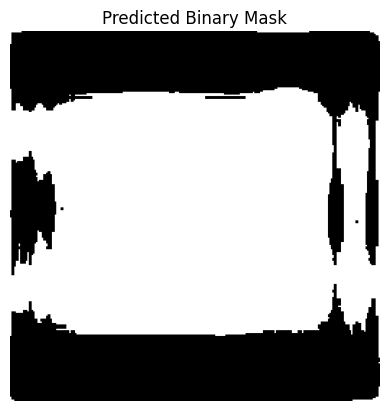

Sum of mask pixel values: 38409120


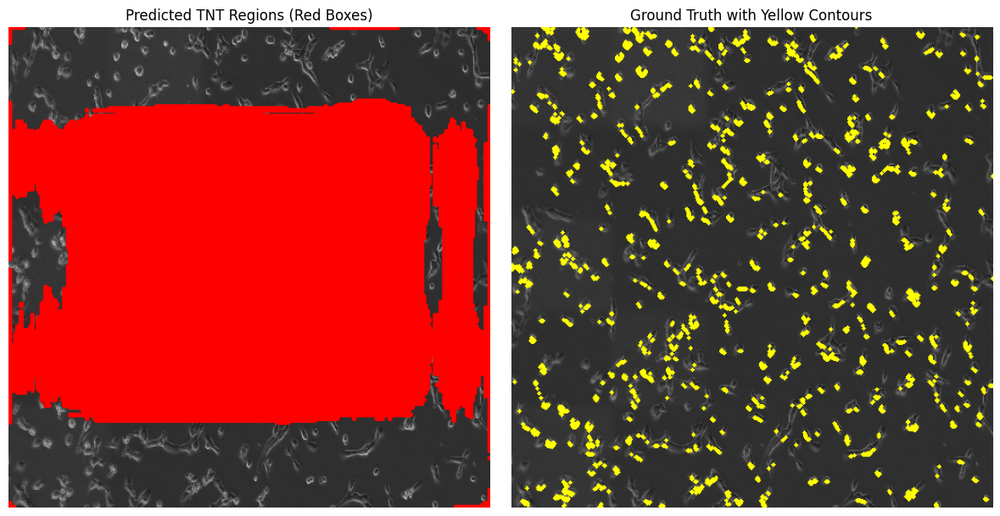

In [55]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import load_img

# Function to load and preprocess a test image (same preprocessing as training)
def load_test_image(image_path, target_size=(512,512)):
    img = load_img(image_path, target_size=target_size)
    img = tf.keras.preprocessing.image.img_to_array(img)
    img = img / 255.0  # scale to [0,1]
    return img

# Paths for a test image and its ground truth label
test_image_path = './data/tnt/m05.png'
test_label_path = './data/tnt/m05-label.png'

# Load and predict on the test image
test_img = load_test_image(test_image_path)
test_img_input = np.expand_dims(test_img, axis=0)
pred_mask = model.predict(test_img_input)

# Use a higher threshold (e.g., 0.08) to generate a cleaner binary mask
pred_mask_bin = (pred_mask > 0.019).astype(np.uint8) * 255

# Squeeze extra dimensions to get a 2D image (e.g., from (1,512,512,1) to (512,512))
pred_mask_bin = np.squeeze(pred_mask_bin)

# Optionally apply a morphological closing to clean up the mask (removes small holes)
kernel = np.ones((3,3), np.uint8)
pred_mask_bin = cv2.morphologyEx(pred_mask_bin, cv2.MORPH_CLOSE, kernel)

# Visualize predicted mask (for debugging)
plt.figure()
plt.imshow(pred_mask_bin, cmap='gray')
plt.title("Predicted Binary Mask")
plt.axis('off')
plt.show()
print("Sum of mask pixel values:", np.sum(pred_mask_bin))

# Convert test image to uint8 and BGR format
test_img_uint8 = (test_img * 255).astype(np.uint8)
test_img_bgr = cv2.cvtColor(test_img_uint8, cv2.COLOR_RGB2BGR)

# Threshold for pixel detection
pixel_threshold = 0.08

# Find pixels where mask exceeds threshold
mask_coords = np.column_stack(np.where(pred_mask_bin > pixel_threshold))

# Draw individual rectangles for each detected pixel
for y, x in mask_coords:
    cv2.rectangle(test_img_bgr, (x, y), (x+1, y+1), (0, 0, 255), 2)

# Convert image to RGB for visualization
pred_vis = cv2.cvtColor(test_img_bgr, cv2.COLOR_BGR2RGB)

# ----- Process ground truth for visualization with yellow contours -----
# Load ground-truth label image for comparison
gt_img = load_test_image(test_label_path, target_size=(512,512))
gt_img = (gt_img * 255).astype(np.uint8)

# Convert to 3-channel image if it's grayscale
if gt_img.shape[-1] == 1:
    gt_img_color = cv2.cvtColor(gt_img, cv2.COLOR_GRAY2BGR)
else:
    gt_img_color = cv2.cvtColor(gt_img, cv2.COLOR_RGB2BGR)

# Threshold the ground truth image to ensure a binary mask
_, gt_mask_bin = cv2.threshold(gt_img[:,:,0], 127, 255, cv2.THRESH_BINARY)

# Find contours in the ground truth mask
contours_gt, _ = cv2.findContours(gt_mask_bin.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Draw yellow contours (BGR: (0, 255, 255)) with thicker lines
for cnt in contours_gt:
    cv2.drawContours(gt_img_color, [cnt], -1, (0, 255, 255), thickness=3)

# Convert the ground truth visualization from BGR to RGB for matplotlib
gt_vis = cv2.cvtColor(gt_img_color, cv2.COLOR_BGR2RGB)
# -----------------------------------------------------------------------

# Display side-by-side: predicted regions and ground truth with yellow contours
plt.figure(figsize=(12,6))
plt.subplot(1,2,1)
plt.imshow(pred_vis)
plt.title("Predicted TNT Regions (Red Boxes)")
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(gt_vis)
plt.title("Ground Truth with Yellow Contours")
plt.axis('off')

plt.tight_layout()
plt.show()


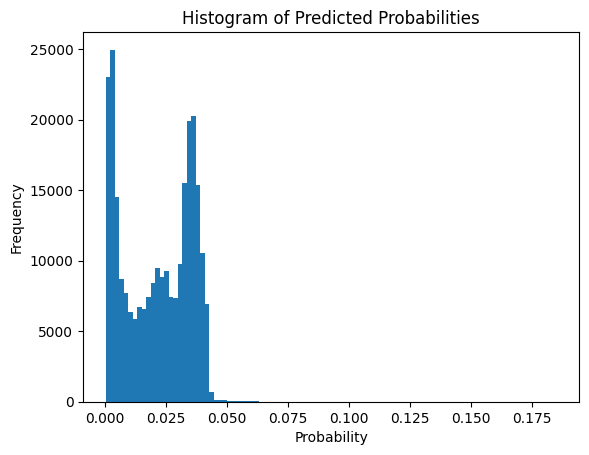

Threshold: 0.004, Sum of mask pixel values: 54487380


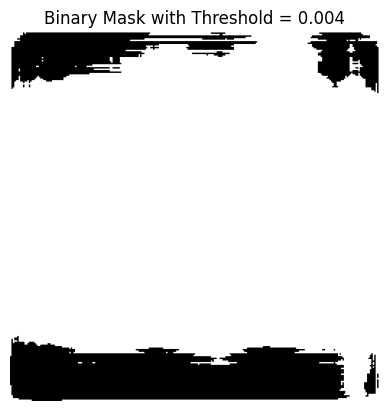

Threshold: 0.005, Sum of mask pixel values: 52417800


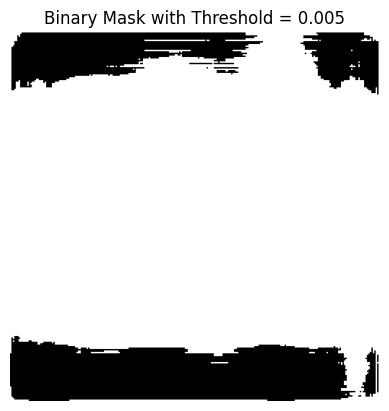

Threshold: 0.006, Sum of mask pixel values: 50594040


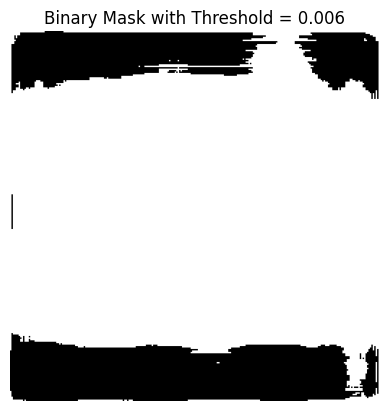

In [46]:
import matplotlib.pyplot as plt
import numpy as np

# Assuming pred_mask is the model output with shape (1, 512, 512, 1)
pred_prob = pred_mask.squeeze()  # shape: (512, 512)

# Plot histogram of predicted probabilities
plt.figure()
plt.hist(pred_prob.flatten(), bins=100)
plt.title("Histogram of Predicted Probabilities")
plt.xlabel("Probability")
plt.ylabel("Frequency")
plt.show()

# Try different thresholds
thresholds = [0.004, 0.005, 0.006]
for thresh in thresholds:
    pred_mask_bin = (pred_prob > thresh).astype(np.uint8) * 255
    print(f"Threshold: {thresh}, Sum of mask pixel values: {np.sum(pred_mask_bin)}")
    plt.figure()
    plt.imshow(pred_mask_bin, cmap='gray')
    plt.title(f"Binary Mask with Threshold = {thresh}")
    plt.axis('off')
    plt.show()


Total samples available: 1200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


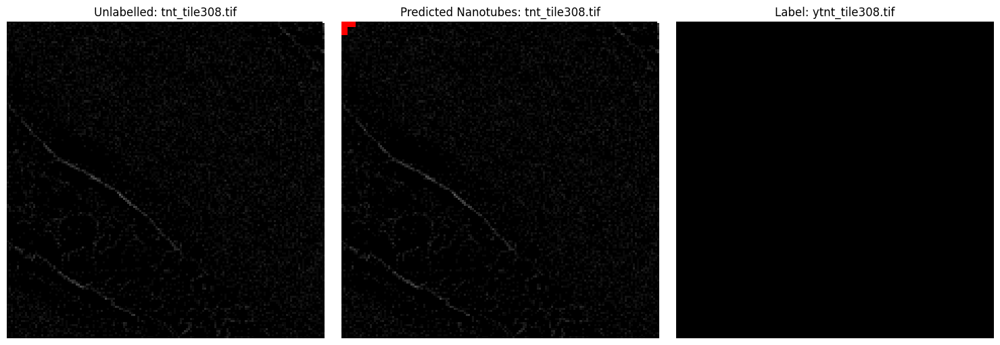

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


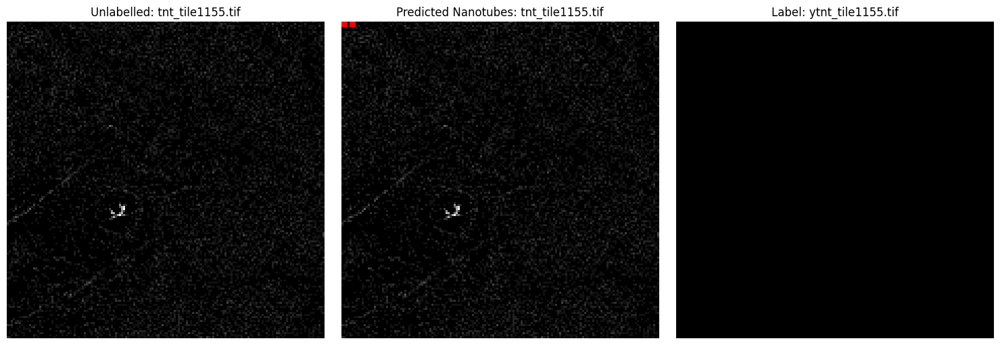

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


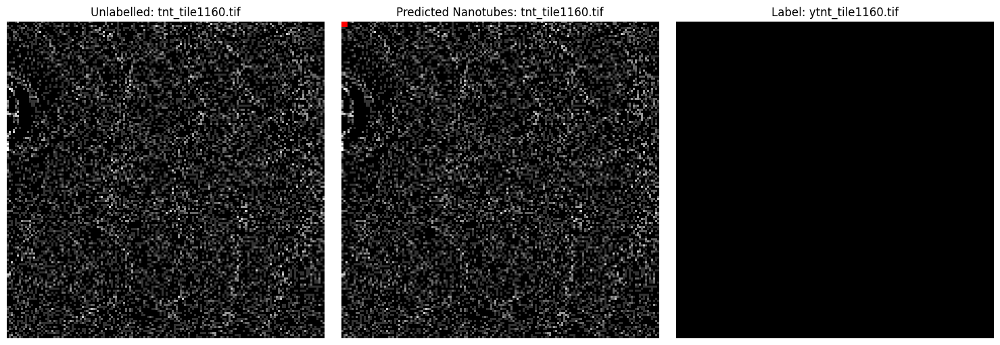

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


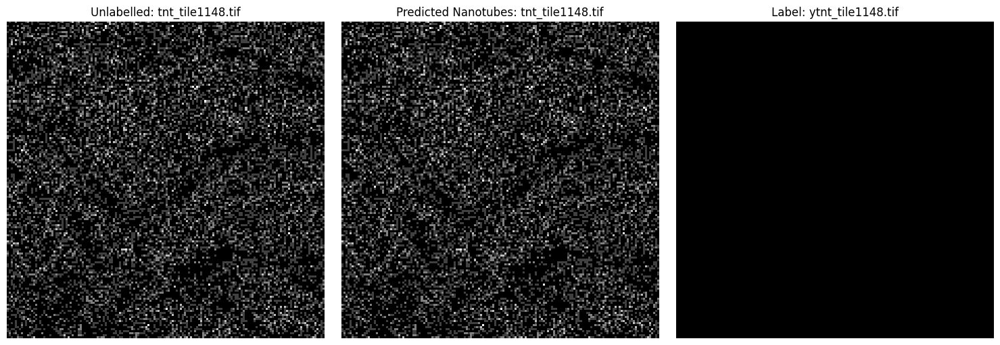

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


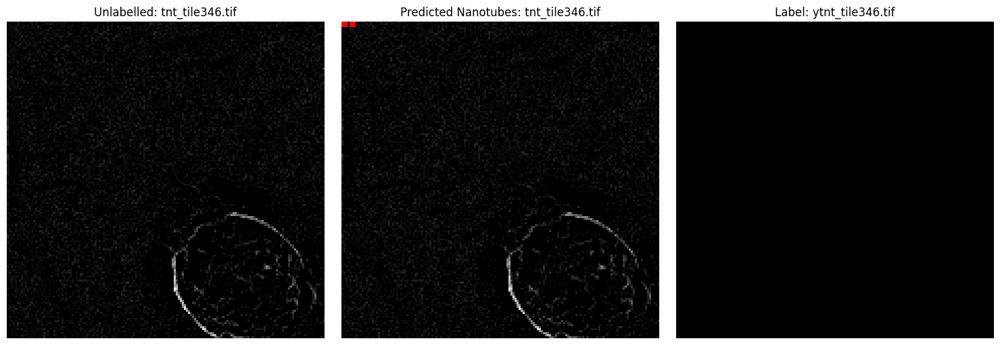

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


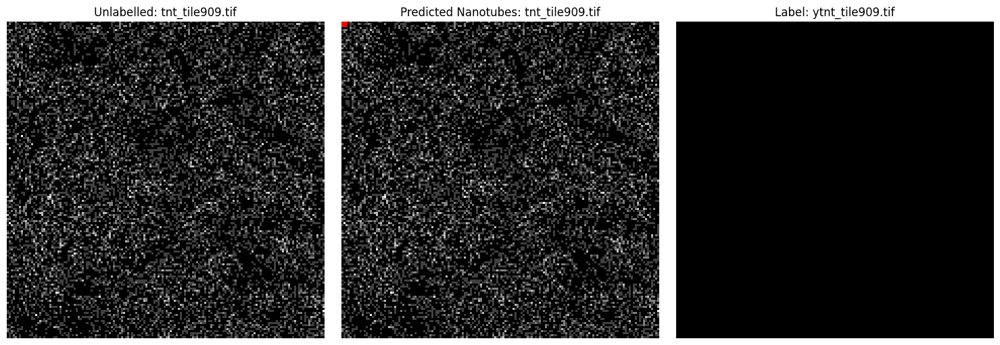

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


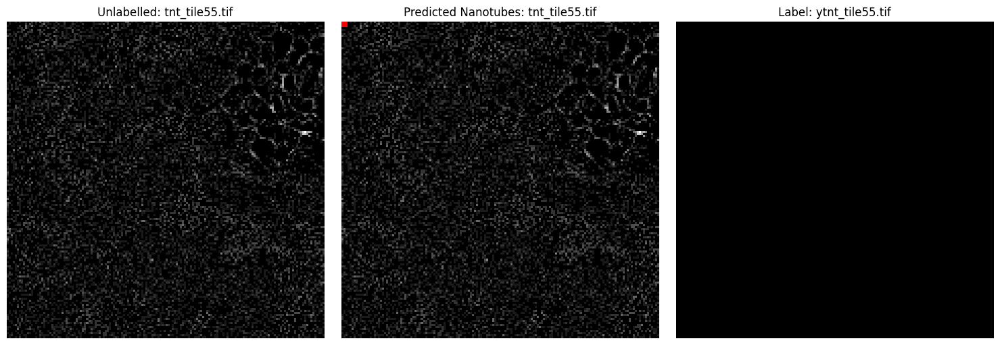

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


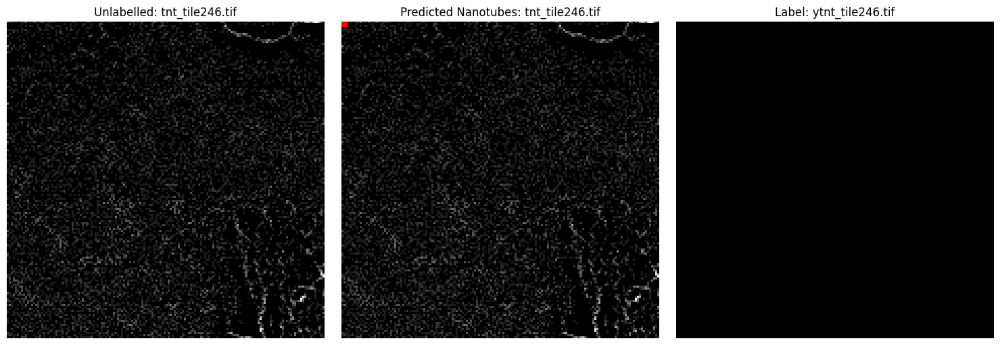

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


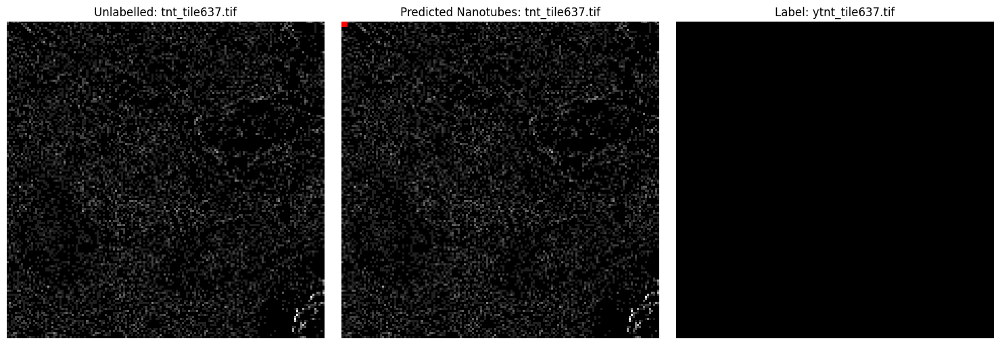

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


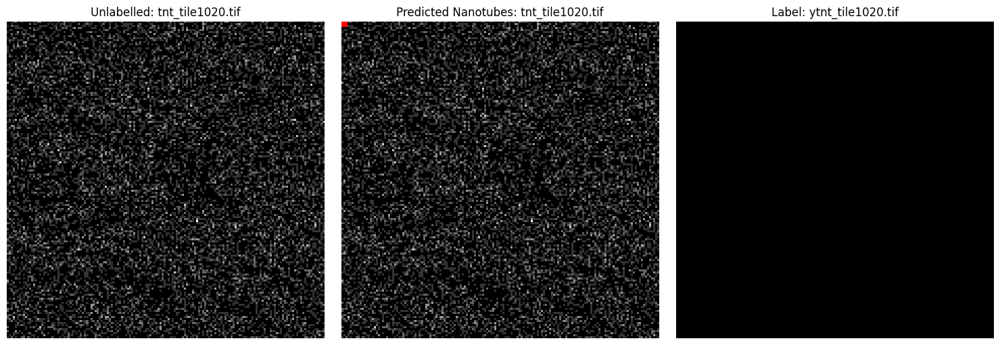

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


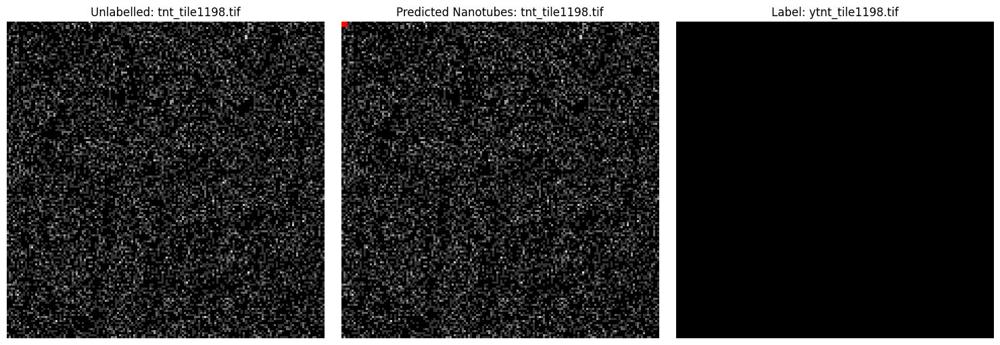

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


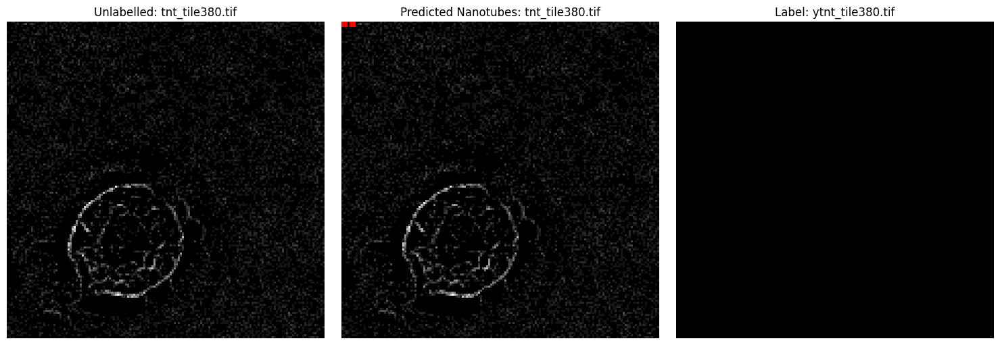

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


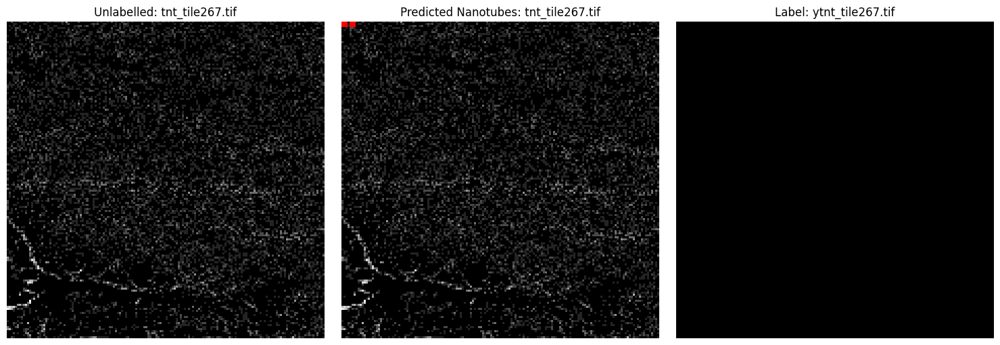

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


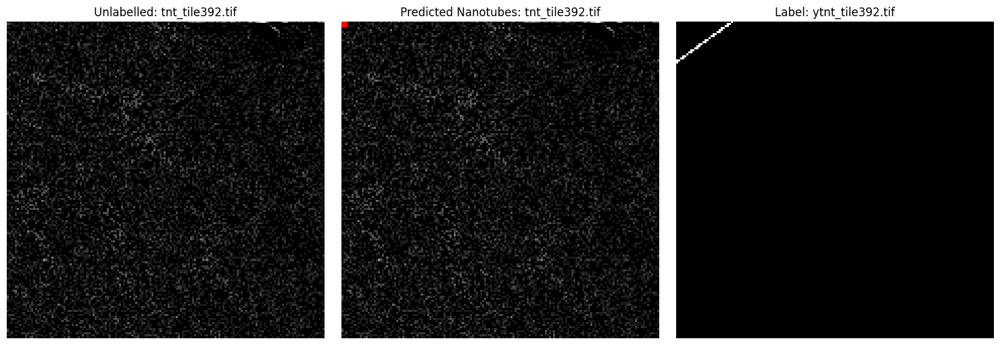

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


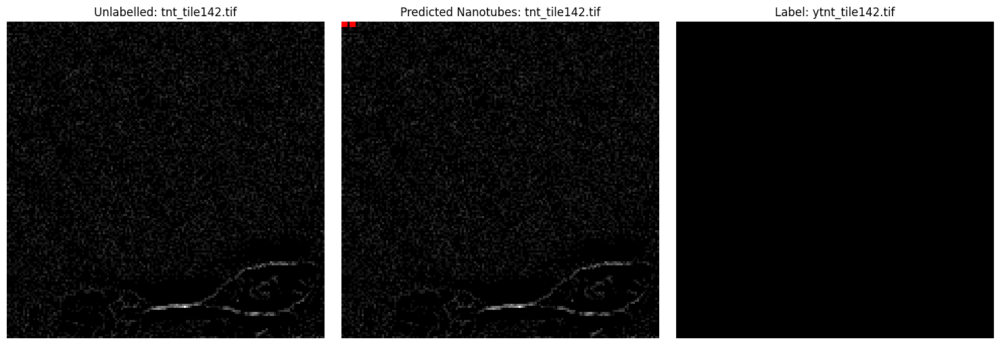

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


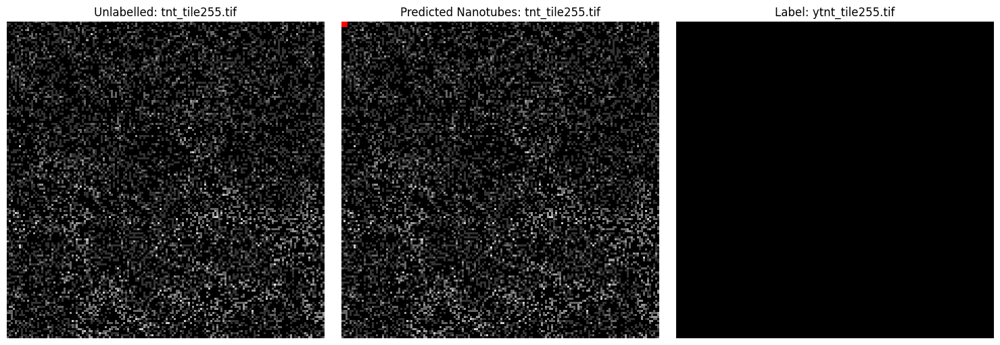

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


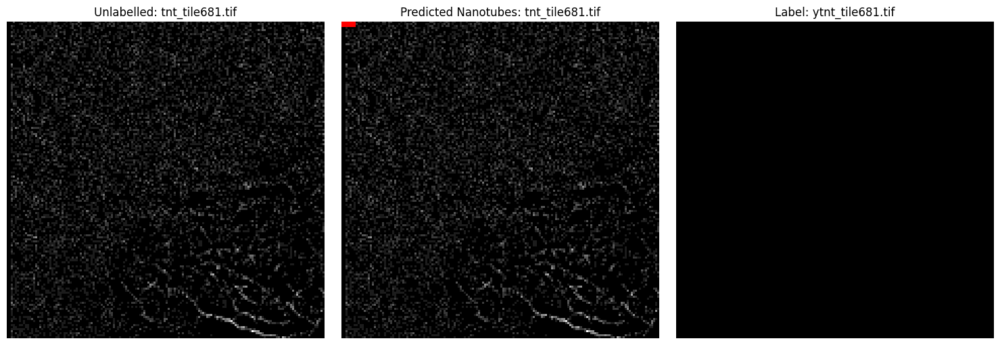

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


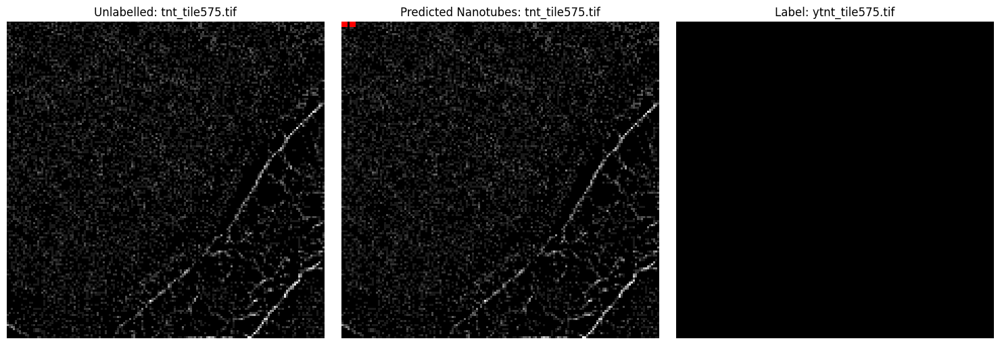

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


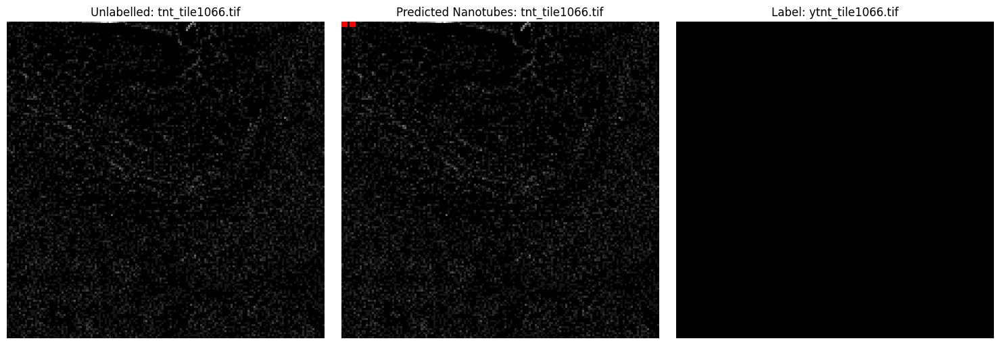

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


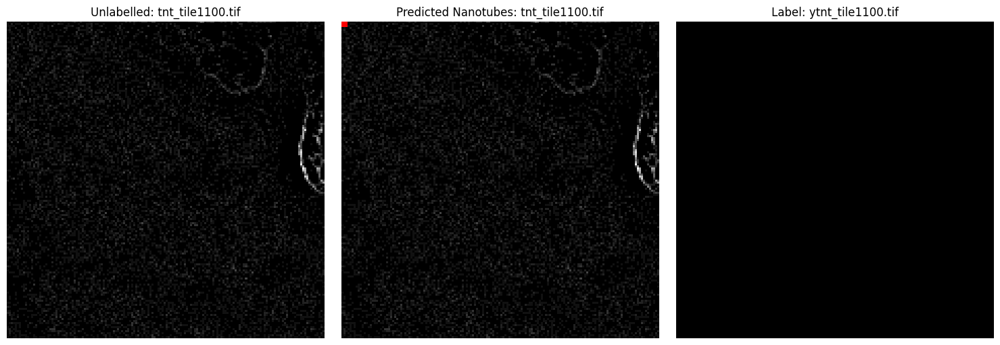

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


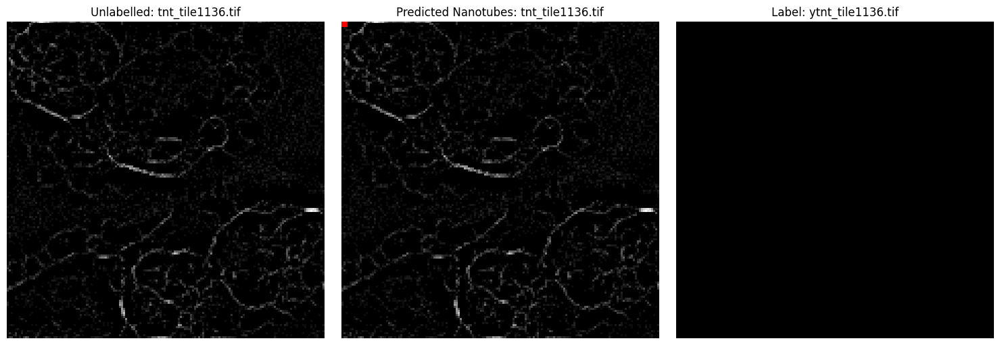

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


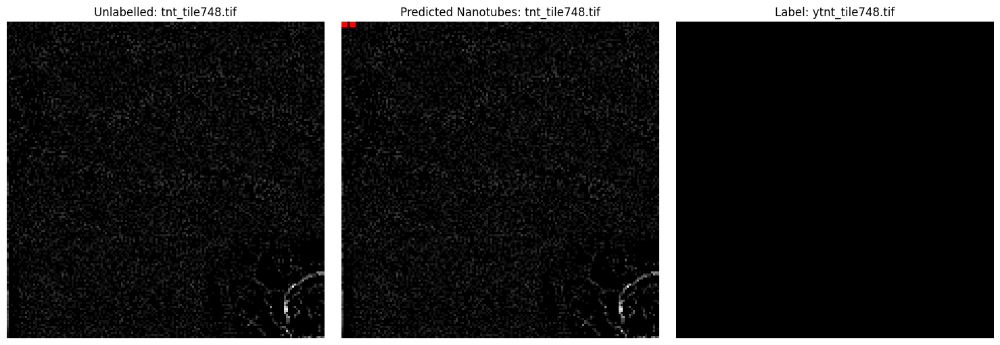

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


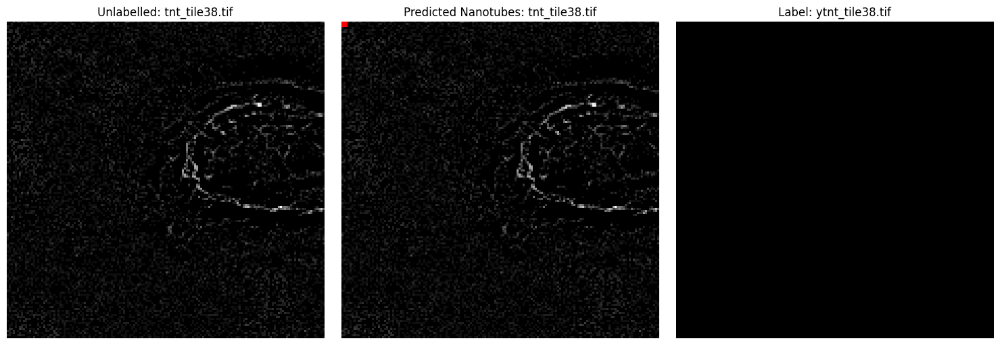

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


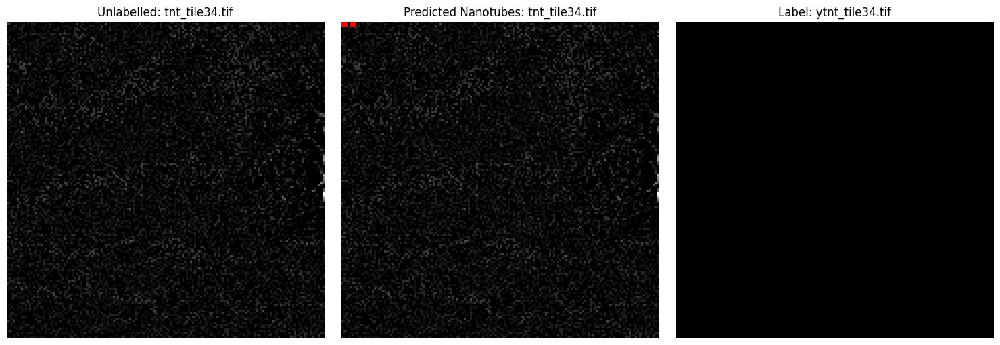

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


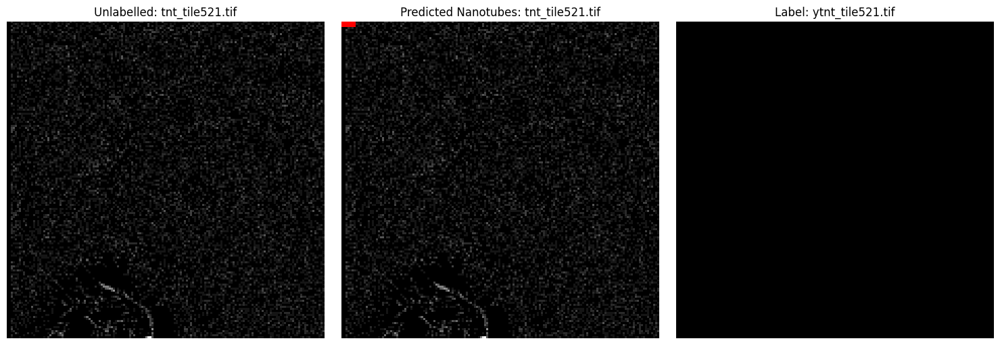

In [52]:
import os
import cv2
import matplotlib.pyplot as plt
import random
import numpy as np
from tensorflow.keras.preprocessing.image import load_img

# Directories containing the images
nolabel_dir = './data/tnt/nolabel'
label_dir = './data/tnt/label'

# Get the lists of filenames
nolabel_files = sorted(os.listdir(nolabel_dir))
label_files = sorted(os.listdir(label_dir))

# Ensure both lists have the same length (or adjust accordingly)
num_samples = len(nolabel_files)
print("Total samples available:", num_samples)

# Randomly choose 25 indices (or fewer if not enough samples)
sample_count = 25
indices = random.sample(range(num_samples), min(sample_count, num_samples))

# Function to load and preprocess a test image
def load_test_image(image_path, target_size=(512,512)):
    img = load_img(image_path, target_size=target_size)
    img = tf.keras.preprocessing.image.img_to_array(img)
    img = img / 255.0  # scale to [0,1]
    return img

# Loop over the selected indices and display the corresponding pairs
for idx in indices:
    nl_file = nolabel_files[idx]
    lab_file = label_files[idx]
    nl_path = os.path.join(nolabel_dir, nl_file)
    lab_path = os.path.join(label_dir, lab_file)
    
    # Load the unlabelled image (color image)
    nl_image = cv2.imread(nl_path)
    if nl_image is None:
        print(f"Could not load image: {nl_path}")
        continue
    # Convert from BGR (OpenCV default) to RGB for displaying with matplotlib
    nl_image_rgb = cv2.cvtColor(nl_image, cv2.COLOR_BGR2RGB)
    
    # Load the labelled image (binary mask); load as grayscale for simplicity
    lab_image = cv2.imread(lab_path, cv2.IMREAD_GRAYSCALE)
    if lab_image is None:
        print(f"Could not load image: {lab_path}")
        continue
    
    # Predict nanotubes using the model
    test_img = load_test_image(nl_path)
    test_img_input = np.expand_dims(test_img, axis=0)
    pred_mask = model.predict(test_img_input)
    pred_mask_bin = (pred_mask > 0.08).astype(np.uint8) * 255  # Threshold
    pred_mask_bin = np.squeeze(pred_mask_bin)
    
    # Overlay small red pixels where the model predicts nanotubes
    prediction_overlay = nl_image_rgb.copy()
    mask_coords = np.column_stack(np.where(pred_mask_bin > 0))
    for y, x in mask_coords:
        cv2.rectangle(prediction_overlay, (x, y), (x+1, y+1), (255, 0, 0), 1)
    
    # Create a figure with three subplots side by side
    plt.figure(figsize=(15, 5))
    plt.subplot(1, 3, 1)
    plt.imshow(nl_image_rgb)
    plt.title(f'Unlabelled: {nl_file}')
    plt.axis('off')
    
    plt.subplot(1, 3, 2)
    plt.imshow(prediction_overlay)
    plt.title(f'Predicted Nanotubes: {nl_file}')
    plt.axis('off')
    
    plt.subplot(1, 3, 3)
    plt.imshow(lab_image, cmap='gray')
    plt.title(f'Label: {lab_file}')
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()
